<div class="alert alert-success">
<b>Reviewer's comment V3</b>

The code is accepted! Based on your best model's ROC-AUC, you've got 6 SP. Congratulations!

</div>

**Review**

Hi, my name is Dmitry and I will be reviewing your project.
  
You can find my comments in colored markdown cells:
  
<div class="alert alert-success">
  If everything is done successfully.
</div>
  
<div class="alert alert-warning">
  If I have some (optional) suggestions, or questions to think about, or general comments.
</div>
  
<div class="alert alert-danger">
  If a section requires some corrections. Work can't be accepted with red comments.
</div>
  
Please don't remove my comments, as it will make further review iterations much harder for me.
  
Feel free to reply to my comments or ask questions using the following template:
  
<div class="alert alert-info">
  For your comments and questions.
</div>
  
First of all, thank you for turning in the code! You did a pretty good job overall, but unfortunately there are some problems that need to be fixed before the code is accepted. See comments below for details

# Solution Code

## Import Libraries

In [1]:
import re
import random
import pandas as pd
pd.options.display.float_format = "{:,.2f}".format
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression,LogisticRegressionCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, r2_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, confusion_matrix, auc, make_scorer
from catboost import CatBoostClassifier

## Extra Functions

In [2]:
def camel2snake(name):
    return name[0].lower() + re.sub(r'(?!^)[A-Z]', lambda x: '_' + x.group(0).lower(), name[1:])

In [3]:
def fix_column_names(df):
    df.columns = df.columns.str.replace(' ', '_')
    df.columns = df.columns.str.lower()
    return df

In [4]:
def upsample(features, target, repeat):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_upsampled = pd.concat([features_zeros] + [features_ones] * repeat)
    target_upsampled = pd.concat([target_zeros] + [target_ones] * repeat)

    features_upsampled, target_upsampled = shuffle(
        features_upsampled, target_upsampled, random_state=12345
    )

    return features_upsampled, target_upsampled

In [5]:
def downsample(features, target, fraction):
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    features_downsampled = pd.concat(
        [features_zeros.sample(frac=fraction, random_state=random_state)]
        + [features_ones]
    )
    target_downsampled = pd.concat(
        [target_zeros.sample(frac=fraction, random_state=random_state)]
        + [target_ones]
    )

    features_downsampled, target_downsampled = shuffle(
        features_downsampled, target_downsampled, random_state=random_state
    )

    return features_downsampled, target_downsampled

In [6]:
def full_stats(data):
    mean = data.mean()
    median = data.quantile(0.50)
    minimum = data.min()
    maximum = data.max()
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3-q1
    big_outliers = q3 + (1.5*iqr)
    small_outliers = q1 - (1.5*iqr)
    stdev = np.std(data)
    variance = np.var(data)
    deviations = data - mean
    display(deviations)
    report = pd.DataFrame(data={'minimum':[minimum],
                                'q1':[q1],
                                'median':[median],
                                'q3':[q3],
                                'maximum':[maximum],
                                'iqr':[iqr],
                                'big_outliers':[big_outliers],
                                'small_outliers':[small_outliers],
                                'standard_deviation':[stdev],
                                'variance':[variance]})
    return report

In [7]:
def get_stats(data):
    count = data.count()
    mean = data.mean()
    median = data.quantile(0.50)
    minimum = data.min()
    maximum = data.max()
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3-q1
    big_outliers = q3 + (1.5*iqr)
    small_outliers = q1 - (1.5*iqr)
    stdev = np.std(data)
    variance = np.var(data)
    deviations = abs(data - mean)
    mad = deviations.mean()
    return [count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,stdev,variance,mad]

In [8]:
def full_score_report(model, features, target, predictions):
    accuracy = accuracy_score(target, predictions)
    f1 = round(f1_score(target,predictions),3)
    r2 = round(r2_score(target,predictions),3)
    roc_auc = round(roc_auc_score(target,predictions),3)
    matrix = confusion_matrix(target,predictions)
    recall = round(recall_score(target,predictions),3)
    precision = round(precision_score(target,predictions),3)
    probabilities = model.predict_proba(features)
    auc_roc = roc_auc_score(target_test, probabilities[:,1])    
    fig, ax = plt.subplots(1,2,figsize=(10,7))
    fpr, tpr, thresholds = roc_curve(target, probabilities[:,1])
    precision, recall, thresholds = precision_recall_curve(target, predictions)
    ax[0].plot(fpr,tpr)
    ax[0].plot([0, 1], [0, 1],'r--')
    ax[1].plot([0, 1], [1, 0],'r--')  
    ax[1].plot(recall,precision,lw=2)
    ax[0].set_xlim([0.0,1.1])
    ax[0].set_ylim([0.0,1.1])
    ax[0].set_xlabel('False Positive Rate')
    ax[0].set_ylabel('True Positive Rate')
    ax[0].set_title('ROC Curve\n'
                    f'AUC: {auc(fpr,tpr):.2}')
    ax[1].set_xlim([0.0,1.1])
    ax[1].set_ylim([0.0,1.1])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('Precision-Recall Curve\n'
                    f'AUC: {auc(recall, precision):.2}')
    plt.show()

In [9]:
def get_scores(model, features, target, predictions):
    accuracy = accuracy_score(target, predictions)
    f1 = round(f1_score(target,predictions),3)
    r2 = round(r2_score(target,predictions),3)
    matrix = confusion_matrix(target,predictions)
    recall = round(recall_score(target,predictions),3)
    precision = round(precision_score(target,predictions),3)
    probabilities = model.predict_proba(features)[:,1]
    auc_roc = roc_auc_score(target, probabilities)
    return [accuracy,recall,precision,f1,r2,matrix,auc_roc]

## Load Data

In [10]:
contract = pd.read_csv('/datasets/final_provider/contract.csv',index_col=[0])
contract.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   BeginDate         7043 non-null   object 
 1   EndDate           7043 non-null   object 
 2   Type              7043 non-null   object 
 3   PaperlessBilling  7043 non-null   object 
 4   PaymentMethod     7043 non-null   object 
 5   MonthlyCharges    7043 non-null   float64
 6   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(6)
memory usage: 440.2+ KB


In [11]:
personal = pd.read_csv('/datasets/final_provider/personal.csv',index_col=[0])
personal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   gender         7043 non-null   object
 1   SeniorCitizen  7043 non-null   int64 
 2   Partner        7043 non-null   object
 3   Dependents     7043 non-null   object
dtypes: int64(1), object(3)
memory usage: 275.1+ KB


In [12]:
internet = pd.read_csv('/datasets/final_provider/internet.csv',index_col=[0])
internet.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5517 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   InternetService   5517 non-null   object
 1   OnlineSecurity    5517 non-null   object
 2   OnlineBackup      5517 non-null   object
 3   DeviceProtection  5517 non-null   object
 4   TechSupport       5517 non-null   object
 5   StreamingTV       5517 non-null   object
 6   StreamingMovies   5517 non-null   object
dtypes: object(7)
memory usage: 344.8+ KB


<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

This is a dataset for a different project. The correct datasets are stored in the `/datasets/final_provider/` directory. Not sure how you merged this dataframe with others as it has an entirely different format for user ids...

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed!

</div>

In [13]:
phone = pd.read_csv('/datasets/final_provider/phone.csv',index_col=[0])
phone.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6361 entries, 5575-GNVDE to 3186-AJIEK
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MultipleLines  6361 non-null   object
dtypes: object(1)
memory usage: 99.4+ KB


## EDA

In [14]:
for df in [contract, personal, internet, phone]:
    new_cols = []
    for col in df.columns:
        if col=='customerID':
            new_cols.append('customer_id')
        elif col=='StreamingTV':
            new_cols.append('streaming_tv')
        else:
            new_cols.append(camel2snake(col))
    df.columns = new_cols

In [15]:
contract.columns

Index(['begin_date', 'end_date', 'type', 'paperless_billing', 'payment_method',
       'monthly_charges', 'total_charges'],
      dtype='object')

In [16]:
personal.columns

Index(['gender', 'senior_citizen', 'partner', 'dependents'], dtype='object')

In [17]:
internet.columns

Index(['internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv',
       'streaming_movies'],
      dtype='object')

In [18]:
phone.columns

Index(['multiple_lines'], dtype='object')

In [19]:
contract.head()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customerID,,,,,,,
7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65


In [20]:
personal.head()

,gender,senior_citizen,partner,dependents
customerID,,,,
7590-VHVEG,Female,0,Yes,No
5575-GNVDE,Male,0,No,No
3668-QPYBK,Male,0,No,No
7795-CFOCW,Male,0,No,No
9237-HQITU,Female,0,No,No


In [21]:
internet.head()

,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customerID,,,,,,,
7590-VHVEG,DSL,No,Yes,No,No,No,No
5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3668-QPYBK,DSL,Yes,Yes,No,No,No,No
7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
9237-HQITU,Fiber optic,No,No,No,No,No,No


In [22]:
phone.head()

,multiple_lines
customerID,
5575-GNVDE,No
3668-QPYBK,No
9237-HQITU,No
9305-CDSKC,Yes
1452-KIOVK,Yes


In [23]:
internet.head()

,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customerID,,,,,,,
7590-VHVEG,DSL,No,Yes,No,No,No,No
5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3668-QPYBK,DSL,Yes,Yes,No,No,No,No
7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
9237-HQITU,Fiber optic,No,No,No,No,No,No


In [24]:
contract['begin_date'] = pd.to_datetime(contract['begin_date'])

In [25]:
contract_personal = contract.merge(personal, 
                                   left_index=True,
                                   right_index=True,
                                   how='outer')

In [26]:
contract_personal_phone = contract_personal.merge(phone,
                                                  how='outer',
                                                  left_index=True,
                                                  right_index=True)

In [27]:
contract_personal_phone['multiple_lines'] = contract_personal_phone['multiple_lines'].fillna('N/A')
contract_personal_phone.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   begin_date         7043 non-null   datetime64[ns]
 1   end_date           7043 non-null   object        
 2   type               7043 non-null   object        
 3   paperless_billing  7043 non-null   object        
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_charges      7043 non-null   object        
 7   gender             7043 non-null   object        
 8   senior_citizen     7043 non-null   int64         
 9   partner            7043 non-null   object        
 10  dependents         7043 non-null   object        
 11  multiple_lines     7043 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(9)
memory usage: 715.3+ KB


In [28]:
full_df = contract_personal_phone.merge(internet,
                                        left_index=True,
                                        right_index=True,
                                        how='outer')

In [29]:
full_df['begin_date'] = pd.to_datetime(full_df['begin_date'])

In [30]:
full_df['paperless_billing'] = full_df['paperless_billing'].map({'No':0,'Yes':1})
full_df['gender'] = full_df['gender'].map({'Male':0,'Female':1})
full_df['partner'] = full_df['partner'].map({'No':0,'Yes':1})
full_df['dependents'] = full_df['dependents'].map({'No':0,'Yes':1})

In [31]:
full_df['internet_service'] = full_df['internet_service'].fillna('No')
full_df = full_df.fillna('N/A')

In [32]:
for col in ['multiple_lines','online_security','online_backup',
            'streaming_movies','device_protection','tech_support',
            'streaming_tv']:
    full_df[col] = full_df[col].map({'No':0,'Yes':1,'N/A':-1})

In [33]:
full_df['total_charges'].loc[(full_df['total_charges']==' ')] = '0'

In [34]:
for col in ['multiple_lines','online_security','online_backup',
            'streaming_movies','device_protection','tech_support',
            'streaming_tv','paperless_billing','gender','partner','dependents']:
    full_df[col] = full_df[col].astype('int64')

In [35]:
full_df['total_charges'] = full_df['total_charges'].astype('float64')
full_df['monthly_charges'] = full_df['monthly_charges'].astype('float64')

In [36]:
full_df = full_df.drop(full_df[full_df['begin_date']=='0'].index,axis=0)
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   begin_date         7043 non-null   datetime64[ns]
 1   end_date           7043 non-null   object        
 2   type               7043 non-null   object        
 3   paperless_billing  7043 non-null   int64         
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_charges      7043 non-null   float64       
 7   gender             7043 non-null   int64         
 8   senior_citizen     7043 non-null   int64         
 9   partner            7043 non-null   int64         
 10  dependents         7043 non-null   int64         
 11  multiple_lines     7043 non-null   int64         
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   int64         
 14

In [37]:
full_df['churn'] = full_df['end_date']
full_df.loc[~(full_df['end_date'] == 'No'), 'churn'] = 'Yes'

In [38]:
full_df['churn'] = full_df['churn'].map({'No':0,'Yes':1})

In [39]:
full_df = full_df.round(2)

In [40]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   begin_date         7043 non-null   datetime64[ns]
 1   end_date           7043 non-null   object        
 2   type               7043 non-null   object        
 3   paperless_billing  7043 non-null   int64         
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_charges      7043 non-null   float64       
 7   gender             7043 non-null   int64         
 8   senior_citizen     7043 non-null   int64         
 9   partner            7043 non-null   int64         
 10  dependents         7043 non-null   int64         
 11  multiple_lines     7043 non-null   int64         
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   int64         
 14

<AxesSubplot:xlabel='churn', ylabel='count'>

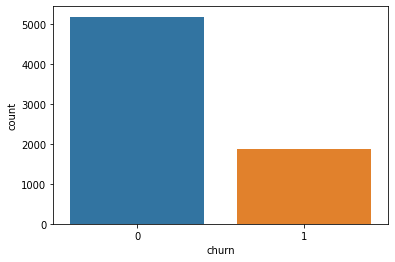

In [41]:
sns.countplot(full_df['churn'])

In [42]:
no_churn = full_df[full_df['churn']==0]['churn'].count()
yes_churn = full_df[full_df['churn']==1]['churn'].count()
print(f'{round((yes_churn/(yes_churn+no_churn)),4)*100}% of customers have churned')

26.540000000000003% of customers have churned


In [43]:
palette = sns.color_palette('pastel')

In [44]:
categorical_features = ['type',
                        'paperless_billing',
                        'payment_method',
                        'gender',
                        'senior_citizen',
                        'partner',
                        'dependents',
                        'multiple_lines']

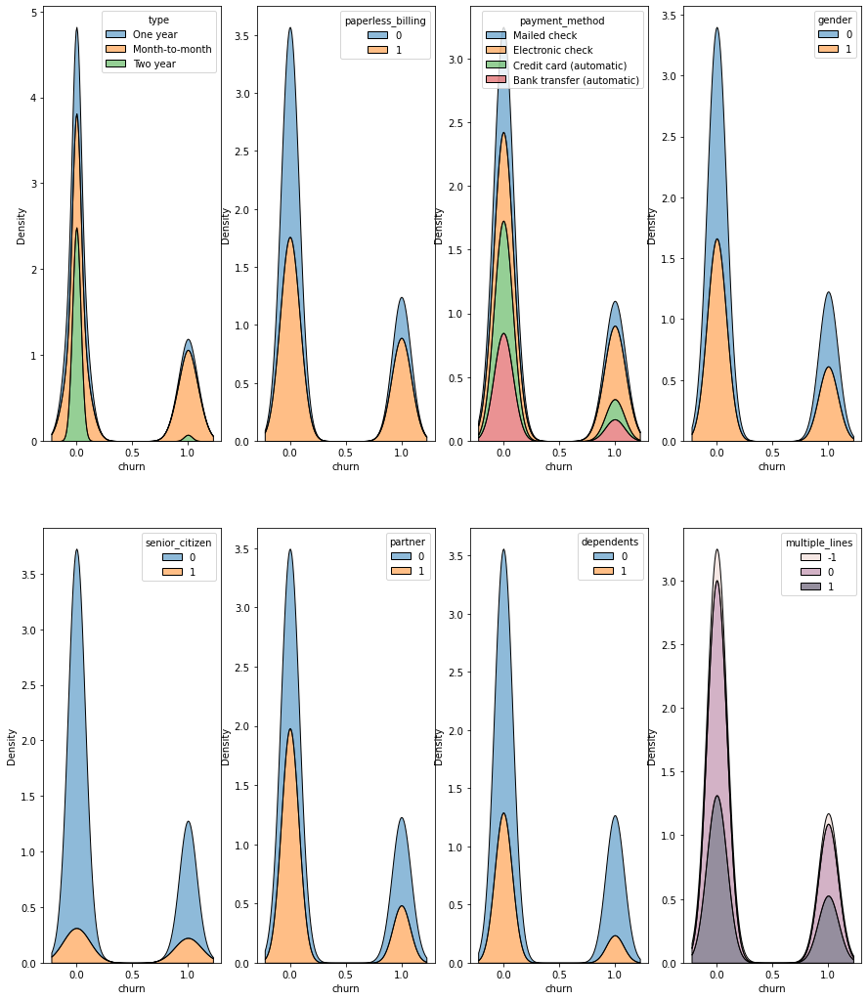

In [45]:
fig, axs = plt.subplots(2,4,figsize=(15,18),sharex=False)
x = 0
y = 0
for col in categorical_features:
    if(y==4):
        y=0
        x+=1
    sns.kdeplot(data=full_df[['churn',col]],
                x='churn',
                hue=col,
                ax=axs[x,y],
                fill=True,
                alpha=0.5,
                multiple='stack')
    
    y+=1
plt.show()

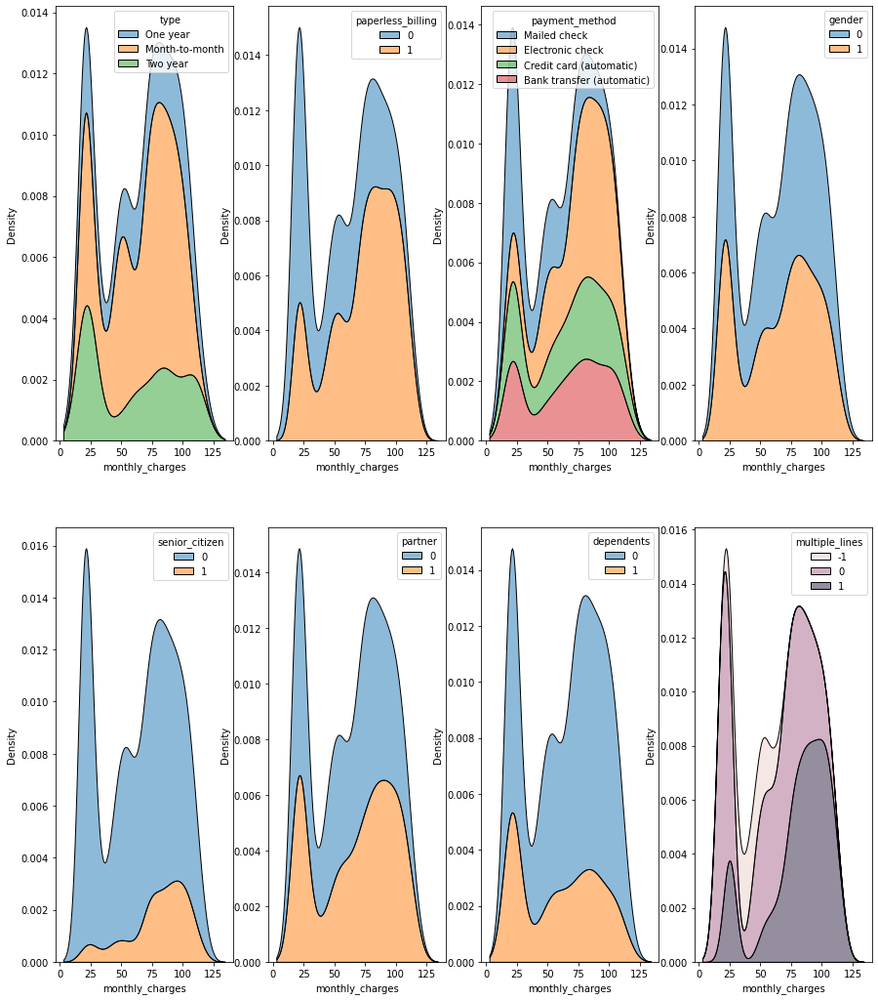

In [46]:
fig, axs = plt.subplots(2,4,figsize=(15,18),sharex=False)
x = 0
y = 0
for col in categorical_features:
    if(y==4):
        y=0
        x+=1
    sns.kdeplot(data=full_df[['monthly_charges',col]],
                x='monthly_charges',
                hue=col,
                ax=axs[x,y],
                fill=True,
                alpha=0.5,
                multiple='stack')
    
    y+=1
plt.show()

<AxesSubplot:xlabel='monthly_charges', ylabel='Density'>

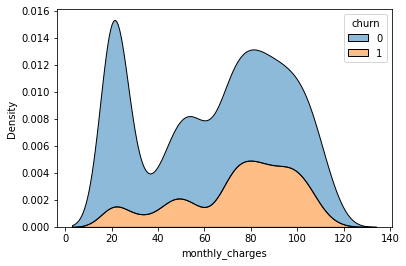

In [47]:
sns.kdeplot(data=full_df[['monthly_charges','churn']],
            x='monthly_charges',
            hue='churn',
            fill=True,
            alpha=0.5,
            multiple='stack')

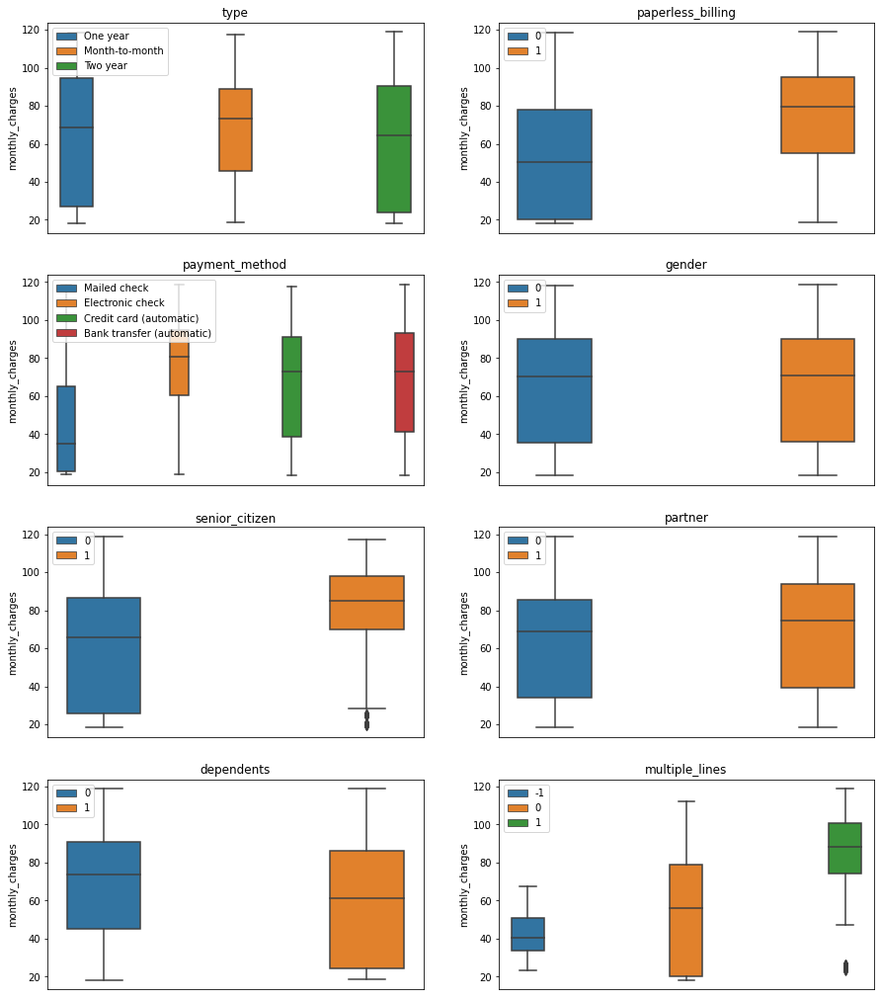

In [48]:
fig, axs = plt.subplots(4,2,figsize=(15,18),sharex=False)
x = 0
y = 0
for col in categorical_features:
    if(y==2):
        y=0
        x+=1
    sns.boxplot(data=full_df[['monthly_charges',col]],
                x=col,
                y='monthly_charges',
                orient='v',
                hue=col,
                ax=axs[x,y])
    axs[x,y].legend(loc='upper left')
    axs[x,y].set_xlabel('')
    axs[x,y].set_xticks([])
    axs[x,y].set_title(col)
    y+=1
plt.show()

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Good job on data preprocessing and EDA! Dataframes were merged correctly

</div>

## Training

### Split/Scale Data

In [49]:
random_state = 42

In [50]:
df_ohe = full_df.drop(['type','payment_method','end_date','internet_service'],axis=1).merge(pd.get_dummies(full_df[['type','payment_method','internet_service']],drop_first=False),
                                                     how='outer',
                                                     left_index=True,
                                                     right_index=True)
df_ohe['begin_date'] = pd.to_numeric(full_df['begin_date'])

<div class="alert alert-success">
<b>Reviewer's comment</b>

Categorical features were encoded

</div>

In [51]:
features = df_ohe.drop('churn',axis=1)
target = df_ohe['churn']

In [52]:
features_train, features_valid, target_train, target_valid = train_test_split(features,target,
                                                                           test_size=0.1,
                                                                           random_state=random_state)

In [53]:
features_train, features_test, target_train, target_test = train_test_split(features_train, target_train,
                                                                            test_size=0.1111111111111,
                                                                            random_state=random_state)

<div class="alert alert-danger">
<S><b>Reviewer's comment</b>

The data was split into train and test sets. There is a problem that you're evaluating models on the test set over and over though. If the test set is used to make decisions about the models, it's not possible to get an unbiased estimate of how the final selected model generalizes to new data. So, I suggest either splitting the data into train/validation/test and using the validation set to compare different models, or utilizing cross-validation on the train set for that purpose.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed!

</div>

In [54]:
scaler = StandardScaler()

In [55]:
features_train_scaled = features_train.copy()
features_valid_scaled = features_valid.copy()
features_test_scaled = features_test.copy()

In [56]:
numeric_features = ['monthly_charges','total_charges','begin_date']

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

User id is not a numerical feature, it doesn't really make sense to use it as a feature at all: it's just a unique identifier to make all users distinct in the database even if they match on all other features.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Ok!

</div>

In [57]:
scaler.fit(features_train_scaled[numeric_features])

StandardScaler()

In [58]:
features_train_scaled[numeric_features] = scaler.transform(features_train_scaled[numeric_features])
features_valid_scaled[numeric_features] = scaler.transform(features_valid_scaled[numeric_features])
features_test_scaled[numeric_features] = scaler.transform(features_test_scaled[numeric_features])

<div class="alert alert-success">
<b>Reviewer's comment</b>

Scaling was applied correctly

</div>

In [59]:
model_quality = pd.DataFrame(columns=['accuracy','recall_score','precision',
                                      'f1_score','r2_score',
                                      'confusion_matrix','roc_auc_score'])

In [60]:
features_down_sample, target_down_sample = downsample(features_train_scaled, target_train, 0.4)

In [61]:
features_up_sample, target_up_sample = upsample(features_train_scaled, target_train, 10)

<div class="alert alert-warning">
<b>Reviewer's comment</b>

It's nice that you thought of applying upsampling and downsampling to deal with class imbalance, but the coefficients seem to be chosen arbitrarily.
    
Also upsampled/downsampled data is not suitable for cross-validation (it's especially clear for upsampling: there can be the same exact examples in train and validation subsets in some folds, but in general, the data we validate the model on should follow the real data distribution). The correct way to mix resampling and cross-validation is to apply it in each fold separately. Check out [imblearn library's pipelines](https://imbalanced-learn.org/stable/references/generated/imblearn.pipeline.Pipeline.html#imblearn.pipeline.Pipeline) and [oversamplers](https://imbalanced-learn.org/stable/references/over_sampling.html)

</div>

### Dummy

In [62]:
dc = DummyClassifier(strategy='most_frequent',random_state=random_state).fit(features_train_scaled, target_train)

In [63]:
dc_predictions = dc.predict(features_test_scaled)

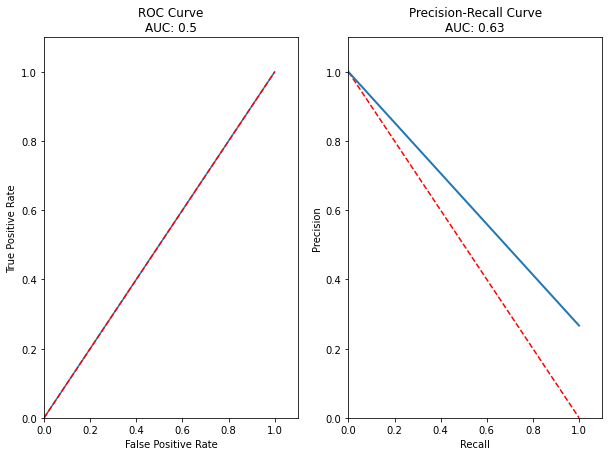

In [64]:
full_score_report(dc,features_test,target_test,dc_predictions)

In [65]:
model_quality.loc['Dummy'] = get_scores(dc,features_test_scaled,target_test,dc_predictions)

In [66]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50


<div class="alert alert-success">
<b>Reviewer's comment</b>

Good to have a simple baseline!

</div>

### Logistic Regression

In [67]:
lr = LogisticRegression(random_state=random_state,
                        class_weight='balanced',
                        max_iter=1000,
                        verbose=0,
                        tol=1e-10).fit(features_train,target_train)

In [68]:
lr.score(features_train,target_train)

0.2677081484111486

In [69]:
lr_predictions = lr.predict(features_valid)

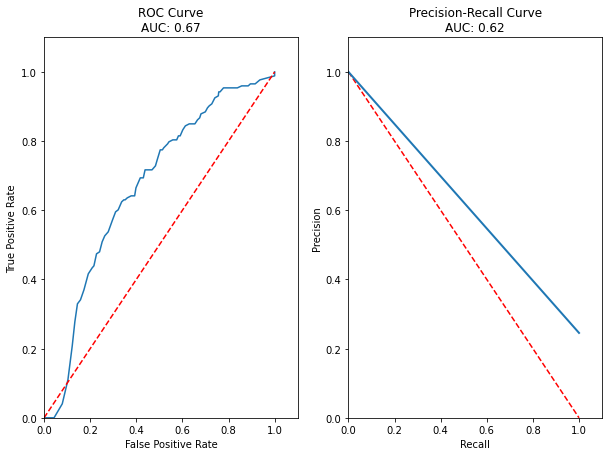

In [70]:
full_score_report(lr,features_valid,target_valid,lr_predictions)

In [71]:
model_quality.loc['Logistic Regression'] = get_scores(lr,features_valid,target_valid,lr_predictions)

In [72]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.25,1.00,0.24,0.39,-3.08,"[[0, 532], [0, 173]]",0.67


In [73]:
pd.DataFrame(classification_report(target_valid, lr_predictions, output_dict=True)).T

,precision,recall,f1-score,support
0,0.00,0.00,0.00,532.00
1,0.25,1.00,0.39,173.00
accuracy,0.25,0.25,0.25,0.25
macro avg,0.12,0.50,0.20,705.00
weighted avg,0.06,0.25,0.10,705.00


In [74]:
lrcv = LogisticRegressionCV(Cs=[0.1,1,10],
                            cv=10,
                            max_iter=10000,
                            scoring='neg_log_loss',
                            verbose=0,
                            random_state=random_state,
                            refit=True,
                            tol=1e-100,
                            solver='liblinear',
                            class_weight='balanced',
                            n_jobs=2).fit(features_down_sample,target_down_sample)

In [75]:
lrcv_predictions = lrcv.predict(features_valid_scaled)

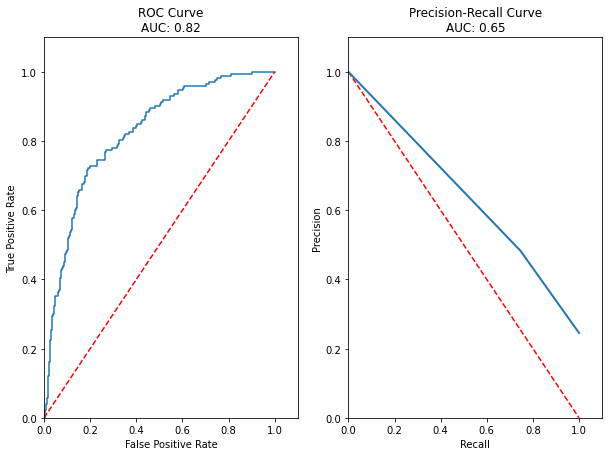

In [76]:
full_score_report(lrcv,features_valid_scaled,target_valid,lrcv_predictions)

In [77]:
model_quality.loc['Logistic Regression CV'] = get_scores(lrcv,features_valid_scaled,target_valid,lrcv_predictions)

In [78]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.25,1.00,0.24,0.39,-3.08,"[[0, 532], [0, 173]]",0.67
Logistic Regression CV,0.74,0.75,0.48,0.59,-0.39,"[[394, 138], [44, 129]]",0.82


In [79]:
pd.DataFrame(classification_report(target_valid, lrcv_predictions, output_dict=True)).T

,precision,recall,f1-score,support
0,0.90,0.74,0.81,532.00
1,0.48,0.75,0.59,173.00
accuracy,0.74,0.74,0.74,0.74
macro avg,0.69,0.74,0.70,705.00
weighted avg,0.80,0.74,0.76,705.00


### Decision Tree Classifier

In [80]:
dtc_parameters = {'criterion':['gini','entropy','log_loss'],
                  'max_depth':[None,3,5,8],
                  'max_features':[None,'auto','sqrt','log2'],
                  'min_samples_split':[2,3,4,5,6],
                  'min_samples_leaf':[1,2,3,4,5],
                  'random_state':[random_state],
                  'class_weight':['balanced',None],
                  'splitter':['best','random']}

In [81]:
dtc = GridSearchCV(DecisionTreeClassifier(),
                   dtc_parameters,
                   scoring=make_scorer(f1_score),
                   cv=5,
                   verbose=10).fit(features_train_scaled,target_train)

Fitting 5 folds for each of 4800 candidates, totalling 24000 fits
[CV 1/5; 1/4800] START class_weight=balanced, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=42, splitter=best
[CV 1/5; 1/4800] END class_weight=balanced, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=42, splitter=best; total time=   0.0s
[CV 2/5; 1/4800] START class_weight=balanced, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=42, splitter=best
[CV 2/5; 1/4800] END class_weight=balanced, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=42, splitter=best; total time=   0.1s
[CV 3/5; 1/4800] START class_weight=balanced, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=42, splitter=best
[CV 3/5; 1/4800] END class_weight=balanced, criterion

In [82]:
dtc_predictions = dtc.best_estimator_.predict(features_valid_scaled)

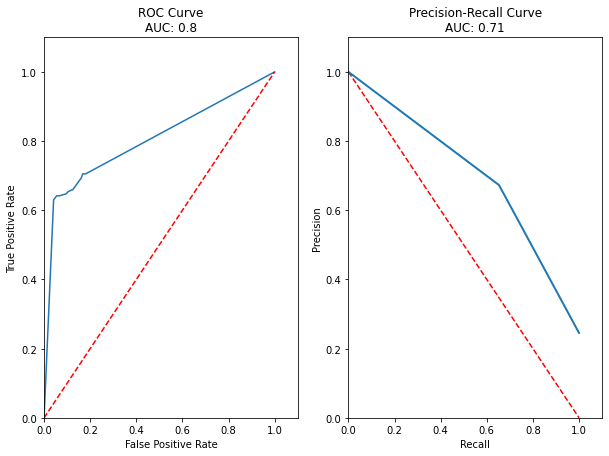

In [83]:
full_score_report(dtc.best_estimator_,features_valid_scaled,target_valid,dtc_predictions)

In [84]:
model_quality.loc['Decision Tree'] = get_scores(dtc.best_estimator_,features_valid_scaled,target_valid,dtc_predictions)

In [85]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.25,1.00,0.24,0.39,-3.08,"[[0, 532], [0, 173]]",0.67
Logistic Regression CV,0.74,0.75,0.48,0.59,-0.39,"[[394, 138], [44, 129]]",0.82
Decision Tree,0.84,0.65,0.67,0.66,0.12,"[[477, 55], [60, 113]]",0.80


In [86]:
pd.DataFrame(classification_report(target_valid, dtc_predictions, output_dict=True)).T

,precision,recall,f1-score,support
0,0.89,0.90,0.89,532.00
1,0.67,0.65,0.66,173.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.78,0.77,0.78,705.00
weighted avg,0.84,0.84,0.84,705.00


In [87]:
feature_importance = pd.DataFrame(data={'dtc':dtc.best_estimator_.feature_importances_},index=features_train_scaled.columns).sort_values(ascending=False,by='dtc')

### Cat Gradient Boost

In [88]:
cbc_parameters = {'verbose':[0],
                  'iterations':[500,1000],
                  'early_stopping_rounds':[1,5],
                  'random_state':[random_state],
                  'learning_rate':[0.0005,0.001,0.01],
                  'eval_metric':['AUC']}

In [89]:
cbc = GridSearchCV(CatBoostClassifier(),
                   cbc_parameters,
                   scoring=make_scorer(f1_score),
                   cv=5,
                   verbose=10).fit(features_train_scaled,target_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0
[CV 1/5; 1/12] END early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0; total time=   1.7s
[CV 2/5; 1/12] START early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0
[CV 2/5; 1/12] END early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0; total time=   1.6s
[CV 3/5; 1/12] START early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0
[CV 3/5; 1/12] END early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42, verbose=0; total time=   1.6s
[CV 4/5; 1/12] START early_stopping_rounds=1, eval_metric=AUC, iterations=500, learning_rate=0.0005, random_state=42,

In [90]:
cbc_predictions = cbc.best_estimator_.predict(features_valid_scaled)

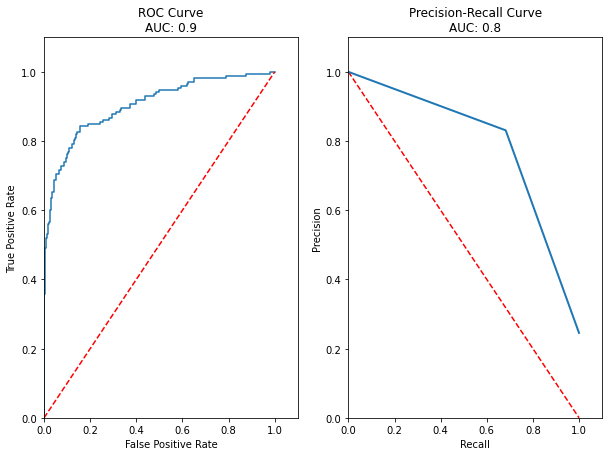

In [91]:
full_score_report(cbc.best_estimator_,features_valid_scaled,target_valid,cbc_predictions)

In [92]:
model_quality.loc['Cat Boost'] = get_scores(cbc.best_estimator_, features_valid_scaled, target_valid, cbc_predictions)

In [93]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.25,1.00,0.24,0.39,-3.08,"[[0, 532], [0, 173]]",0.67
Logistic Regression CV,0.74,0.75,0.48,0.59,-0.39,"[[394, 138], [44, 129]]",0.82
Decision Tree,0.84,0.65,0.67,0.66,0.12,"[[477, 55], [60, 113]]",0.80
Cat Boost,0.89,0.68,0.83,0.75,0.40,"[[508, 24], [55, 118]]",0.90


In [94]:
pd.DataFrame(classification_report(target_valid, cbc_predictions, output_dict=True)).T

,precision,recall,f1-score,support
0,0.90,0.95,0.93,532.00
1,0.83,0.68,0.75,173.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.87,0.82,0.84,705.00
weighted avg,0.88,0.89,0.88,705.00


In [95]:
feature_importance['cbc'] = cbc.best_estimator_.feature_importances_
feature_importance['cbc'] = feature_importance['cbc']/feature_importance['cbc'].sum()

In [96]:
feature_importance

,dtc,cbc
total_charges,0.30,0.29
begin_date,0.19,0.01
type_Month-to-month,0.19,0.06
monthly_charges,0.14,0.26
internet_service_Fiber optic,0.04,0.00
multiple_lines,0.01,0.01
streaming_movies,0.01,0.00
payment_method_Electronic check,0.01,0.01
tech_support,0.01,0.02
device_protection,0.01,0.02


### Random Forest Classifier

In [97]:
rfr_parameters = {'random_state':[random_state],
                  'warm_start':[True],
                  'class_weight':['balanced'],
                  'n_estimators':[50,100,150],
                  'max_depth':[None,4,6],
                  'max_features':[None],
                  'min_samples_leaf':[1,4],
                  'verbose':[0]}

In [98]:
rfr = GridSearchCV(RandomForestClassifier(),
                   rfr_parameters,cv=5,
                   verbose=10,
                   scoring=make_scorer(f1_score)).fit(features_train_scaled,target_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5; 1/18] START class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50, random_state=42, verbose=0, warm_start=True
[CV 1/5; 1/18] END class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50, random_state=42, verbose=0, warm_start=True; total time=   0.9s
[CV 2/5; 1/18] START class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50, random_state=42, verbose=0, warm_start=True
[CV 2/5; 1/18] END class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50, random_state=42, verbose=0, warm_start=True; total time=   1.0s
[CV 3/5; 1/18] START class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_estimators=50, random_state=42, verbose=0, warm_start=True
[CV 3/5; 1/18] END class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, n_esti

In [99]:
rfr_predictions = rfr.best_estimator_.predict(features_valid_scaled)

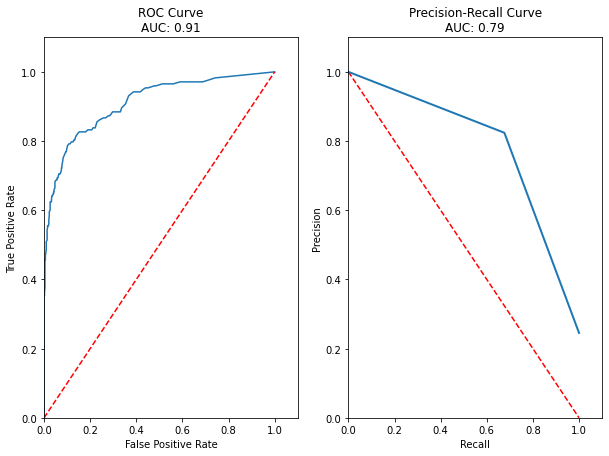

In [100]:
full_score_report(rfr.best_estimator_,features_valid_scaled,target_valid,rfr_predictions)

In [101]:
model_quality.loc['Random Forest'] = get_scores(rfr.best_estimator_, features_valid_scaled, target_valid, rfr_predictions)

In [102]:
model_quality

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.25,1.00,0.24,0.39,-3.08,"[[0, 532], [0, 173]]",0.67
Logistic Regression CV,0.74,0.75,0.48,0.59,-0.39,"[[394, 138], [44, 129]]",0.82
Decision Tree,0.84,0.65,0.67,0.66,0.12,"[[477, 55], [60, 113]]",0.80
Cat Boost,0.89,0.68,0.83,0.75,0.40,"[[508, 24], [55, 118]]",0.90
Random Forest,0.89,0.68,0.82,0.74,0.38,"[[507, 25], [56, 117]]",0.91


In [103]:
pd.DataFrame(classification_report(target_valid, rfr_predictions, output_dict=True)).T

,precision,recall,f1-score,support
0,0.90,0.95,0.93,532.00
1,0.82,0.68,0.74,173.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.86,0.81,0.83,705.00
weighted avg,0.88,0.89,0.88,705.00


In [104]:
feature_importance['rfr'] = rfr.best_estimator_.feature_importances_
feature_importance['rfr'] = feature_importance['rfr']/feature_importance['rfr'].sum()

In [105]:
feature_importance

,dtc,cbc,rfr
total_charges,0.30,0.29,0.19
begin_date,0.19,0.01,0.01
type_Month-to-month,0.19,0.06,0.14
monthly_charges,0.14,0.26,0.22
internet_service_Fiber optic,0.04,0.00,0.01
multiple_lines,0.01,0.01,0.01
streaming_movies,0.01,0.00,0.01
payment_method_Electronic check,0.01,0.01,0.01
tech_support,0.01,0.02,0.01
device_protection,0.01,0.02,0.01


<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

It's great that you tried different models and tuned their hyperparameters! One small problem: the perfect scores of several models are a clear indication that some kind of target leakage is going on. Please investigate which features are leaking target and remove them.

</div>

<div class="alert alert-danger">
<s><b>Reviewer's comment V2</b>

Great!
    
A couple of more corrections are needed. I noticed that the ROC-AUC in the ROC curve plots and in the table with results are different.

In some places in the scoring functions global variables for the test set features and targets are used.
    
Also, what difference did you intend to make between `auc_roc` and `roc_auc`? One is correctly calculated using probabilities (although not with input data for some reason), the other incorrectly uses binary predictions

</div>

<div class="alert alert-info">
  I copy and pasted the get_scores function from an old project of mine, and it made better sense in that context. I adjusted it and it should be correct now. 
</div>

<div class="alert alert-success">
<b>Reviewer's comment V3</b>

I see! Case in point for how it's important to be careful when copy and pasting code :)

</div>

## Testing All Models

In [106]:
dc_test = dc.predict(features_test_scaled)
lr_test = lr.predict(features_test_scaled)
lrcv_test = lrcv.predict(features_test_scaled)
rfr_test = rfr.best_estimator_.predict(features_test_scaled)
cbc_test = cbc.best_estimator_.predict(features_test_scaled)
dtc_test = dtc.best_estimator_.predict(features_test_scaled)

In [108]:
model_test_scores = pd.DataFrame(columns=['accuracy','recall_score','precision',
                                      'f1_score','r2_score',
                                      'confusion_matrix','roc_auc_score'])
model_test_scores.loc['Dummy'] = get_scores(dc, features_test_scaled, target_test, dc_test)
model_test_scores.loc['Decision Tree'] = get_scores(dtc, features_test_scaled, target_test, dtc_test)
model_test_scores.loc['Logistic Regression'] = get_scores(lr, features_test_scaled, target_test, lr_test)
model_test_scores.loc['Logistic Regression CV'] = get_scores(lrcv, features_test_scaled, target_test, lrcv_test)
model_test_scores.loc['Random Forest'] = get_scores(rfr.best_estimator_, features_test_scaled, target_test, rfr_test)
model_test_scores.loc['Cat Boost'] = get_scores(cbc.best_estimator_, features_test_scaled, target_test, cbc_test)

In [109]:
model_test_scores.sort_values(by='accuracy',ascending=False)

,accuracy,recall_score,precision,f1_score,r2_score,confusion_matrix,roc_auc_score
Random Forest,0.88,0.65,0.85,0.74,0.37,"[[496, 21], [66, 122]]",0.91
Cat Boost,0.87,0.63,0.84,0.72,0.34,"[[495, 22], [69, 119]]",0.91
Decision Tree,0.83,0.68,0.68,0.68,0.12,"[[457, 60], [61, 127]]",0.81
Logistic Regression CV,0.74,0.79,0.51,0.62,-0.34,"[[372, 145], [39, 149]]",0.83
Dummy,0.73,0.00,0.00,0.00,-0.36,"[[517, 0], [188, 0]]",0.50
Logistic Regression,0.56,0.73,0.35,0.47,-1.24,"[[258, 259], [50, 138]]",0.50


<div class="alert alert-warning">
<b>Reviewer's comment V2</b>

As you now have a validation set, it would be better to use the validation set to first select the best model, and then use the test set only to evaluate this one model. That way we can get an unbiased estimate of the final model's generalization performance
    
</div>

<div class="base-markdown base-markdown_with-gallery markdown markdown_size_normal markdown_type_theory"><h1>Solution Report</h1><div class="paragraph">Make a report at the end of the <em>Jupyter Notebook</em> with the solution. The team leader will check it. The code will be reviewed by the team leader only if there are some points of doubt.</div><div class="paragraph">In the report, please answer the following questions:</div><ul><li>What steps of the plan were performed and what steps were skipped (explain why)?</li><li>What difficulties did you encounter and how did you manage to solve them?</li><li>What were some of the key steps to solving the task?</li><li>What is your final model and what quality score does it have?</li></ul><div class="paragraph">Here are some of the criteria used by the team leader:</div><ul><li>Did you answer all the questions?</li><li>Are the answers clear?</li></ul></div>

1. Data was successfully cleaned up, and all files were merged together into one big dataframe with customer_id being the common index for everything. Column data types were changed to more appropriate types such as floats, ints, and floats instead of objects. All remaining categorical data was one hot encoded for stronger models. Data was scaled for more balanced importances and split into train, valid, and test sets at 80-10-10 respectively. The designated target was if a customer churned. All models were trained as GridSearchCV to find the best possible estimator by model. The LGBMClassifier model was skipped since I had a gradient boosting model, and thought it might be redundant. 
2. Some of my biggest challenges were making my density plots useful, visually appealing, and clean. Also, trying to figure out what hyperparameters I want to use that make a stronger model without taking too long to train. My goal was to run the whole notebook in under an hour, and achieve 90% accuracy. I came very close with 45 minutes and 88% accuracy, but saw ROC-AUC of 0.91 as a success. Last challenge I had was figuring out how to display the score and strength of the models in a concise way.
3. The biggest thing was making sure the notebook was easy to read for others. That's where having clear headers and breaks in the code with Markdowns was important. Also, I wanted the code itself to be doable to read, so I tried to run code in smaller chunks
4. The models used were Dummy, Logistic Regression, Decision Tree, Random Forest, and Cat Boost. All models were tested and achieved a top ROC-AUC of 0.91 and Accuracy of 0.88 in the test set for Random Forest. That is a great success.

| Models        | Accuracy    | ROC-AUC |
| ------------- | ----------- |-------- |
| Dummy         | 73%         | 50%     |
| LR            | 56%         | 50%     |
| LRCV          | 74%         | 83%     |
| Decision Tree | 83%         | 81%     |
| Random Forest | 88%         | 91%     |
| Cat Boost     | 87%         | 91%     |